In [1]:
import numpy as np
import random
import itertools
import matplotlib.pyplot as plt
import matplotlib.animation as animation
from celluloid import Camera

In [2]:
#A function that builds the 1st random map
def first_random_map():

    # Define colors
    color_1 = np.array([216, 191, 216])
    color_2 = np.array([221, 173, 275])
    color_3 = np.array([255, 255, 255])
    
    #Just define sizes
    map_0 = np.zeros([N_M,N_M,3])

    size_of_map = N_M**2
    
    empty = int(N_M**2*empty_persent/100)
    white = int((N_M**2-empty)*white_black_distr[0]/100)
    black = int((N_M**2-empty)*white_black_distr[1]/100)

    #create random map for 1st time
    possible_combinations = np.array(list(range(N_M)))
    possible_combinations = np.append(possible_combinations, list(range(N_M)))
    possible_combinations = set((itertools.combinations(possible_combinations, 2)))
    possible_combinations = np.array(list(possible_combinations))

    rand = random.sample(range(N_M**2), N_M**2)

    empty_rand = rand[:empty]
    white_rand = rand[empty:white+empty]
    black_rand = rand[white+empty:]
    
    empty_comb = []
    for i in empty_rand:
        empty_comb.append(possible_combinations[i])

    white_comb = []
    for i in white_rand:
        white_comb.append(possible_combinations[i])

    black_comb = []
    for i in black_rand:
        black_comb.append(possible_combinations[i])

    empty_comb = np.array(empty_comb)
    white_comb = np.array(white_comb)
    black_comb = np.array(black_comb)

    #Assigning color
    for i in white_comb:
        map_0[i[0]][i[1]] = color_1

    for i in black_comb:
        map_0[i[0]][i[1]] = color_2
        
    for i in empty_comb:
        map_0[i[0]][i[1]] = color_3

    map_0 = map_0.astype(dtype = 'uint8')
    
    #Plotting
    plt.figure(figsize=(5, 5))
    plt.title(f'Random map. Size={N_M}x{N_M}. Empty={empty_persent}% X-O distr={white_black_distr}, R={R}')
    plt.imshow(map_0)
    plt.show()
    
    return map_0

In [3]:
#A function that counts the number of neighbors, displays all filled and empty areas
def number_of_neighbors(target_map):
    map_0 = target_map
    
    #Identify Corners and Borders
    bottom = np.meshgrid([-1], list(range(1,N_M-1)))
    bottom = np.array(bottom)
    bottom = bottom.T.reshape(-1, 2)

    right = np.meshgrid(list(range(1,N_M-1)), [-1])
    right = np.array(right)
    right = right.T.reshape(-1, 2)

    bottom_and_right = np.concatenate((bottom, right), axis = 0)

    top_right = [0,-1,3]
    bottom_left = [-1,0,3]
    bottom_right = [-1,-1,3]

    corners = [top_right, bottom_left, bottom_right]
    
    
    #Number of neighbors without [right, bottom, left_bottom, right_bottom, right_top]
    targets = []
    neighbors_number = []
    i_am_empty = []

    for i in range(0, N_M-1):
        for j in range(0, N_M-1):

            target = map_0[i,j,:]

            if sum(target != [255,255,255]):

                n_1_8 = np.array([map_0[i-1,j, :], map_0[i-1,j+1, :], map_0[i,j+1, :], map_0[i+1,j, :], map_0[i+1,j+1, :],
                                 map_0[i+1,j-1, :], map_0[i,j-1, :],map_0[i-1,j-1, :]])

                neighbors = sum(sum(target == n_1_8)) // 3

                targets.append([i,j,3])
                neighbors_number.append(neighbors)
            else:
                i_am_empty.append([i,j,3])
                

    #corners: left_bottom, right_bottom, right_top
    for c in corners:
        target = map_0[c[0], c[1], :c[2]]
        if sum(target != [255,255,255]):
            i = c[0]
            j = c[1]
            n_1_8 = np.array([map_0[i-1,j, :], map_0[i-1,j+1, :], map_0[i,j+1, :], map_0[i+1,j, :], map_0[i+1,j+1, :],
                                     map_0[i+1,j-1, :], map_0[i,j-1, :],map_0[i-1,j-1, :]])

            neighbors = sum(sum(target == n_1_8)) // 3

            targets.append([i,j,3])
            neighbors_number.append(neighbors) 
            
        else:
            i_am_empty.append([c[0],c[1],3])

    #right, bottom
    for c in bottom_and_right:
        target = map_0[c[0], c[1], :3]
        if sum(target != [255,255,255]):
            i = c[0]
            j = c[1]
            n_1_8 = np.array([map_0[i-1,j, :], map_0[i-1,j+1, :], map_0[i,j+1, :], map_0[i+1,j, :], map_0[i+1,j+1, :],
                                     map_0[i+1,j-1, :], map_0[i,j-1, :],map_0[i-1,j-1, :]])

            neighbors = sum(sum(target == n_1_8)) // 3

            targets.append([i,j,3])
            neighbors_number.append(neighbors) 
            
        else:
            i_am_empty.append([c[0],c[1],3])
            
    return np.array(targets), np.array(neighbors_number), np.array(i_am_empty)

In [4]:
#The function accepts any map. Calls the number_of_neighbors function. Finds neighbors and changes the map
def plot_changing(target_map):

    for_plot = []

    targets, neighbors_number, i_am_empty = number_of_neighbors(target_map)
    
    map_сopy = target_map.copy()

    dict_R = {'0':0, '1/8':1, '2/8':2, '3/8':3, '4/8':4, '5/8':5, '6/8':6, '7/8':7, '1':8}

    i_want_stay = np.where(neighbors_number >= dict_R[R])
    i_want_move = np.where(neighbors_number < dict_R[R])

    #All possible places where you can move. You can even take the place of another agent who also wants to move
    for i in i_want_move[0]:
        i_am_empty = np.append(i_am_empty, targets[i].reshape(1, 3), axis=0)

    rand_place = random.sample(range(0,len(i_want_move[0])), len(i_want_move[0]))
    #Randomly move agents who want to move, 
    #if the agent is already in this place, then we are looking for another place. 
    #Not all places are available on the map, but only a part of them, which is selected at the very beginning
    
    n = 0
    while n < len(i_want_move[0]):
#         print(i_am_empty[rand_place[n]] != targets[i_want_move[0][n]])

        #Check if we want to move to the same place or not
        if sum(i_am_empty[rand_place[n]] != targets[i_want_move[0][n]]):
            
            new = i_am_empty[rand_place[n]]
            leave = targets[i_want_move[0][n]]

            #Change color
            map_сopy[new[0], new[1], :new[2]] = target_map[leave[0], leave[1], :leave[2]]

            #Delete color
            map_сopy[leave[0], leave[1], :leave[2]] = [255,255,255]

            #Remove from the available list the cell that we just occupied
            np.delete(i_am_empty, rand_place[n])
            np.delete(rand_place, rand_place[n])

            n += 1

            for_plot.append(leave)
            
        else:
            np.random.shuffle(rand_place)


    plt.figure(figsize=(5, 5))
    plt.title(f'Random map. Size={N_M}x{N_M}. Empty={empty_persent}% X-O distr={white_black_distr}, R={R}')

    plt.imshow(map_сopy)
    plt.show()
    
    return map_сopy, for_plot

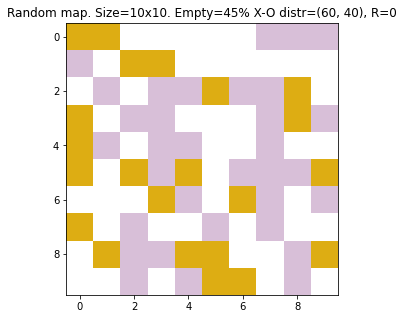

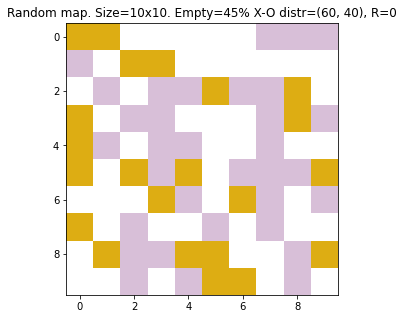

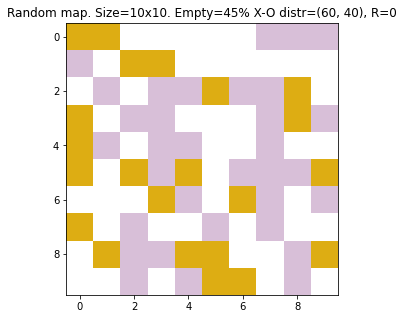

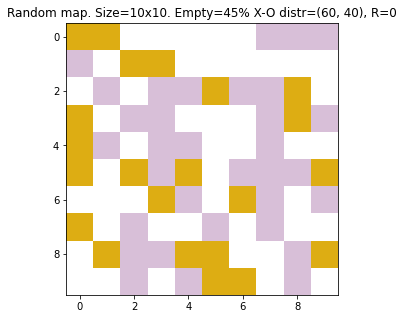

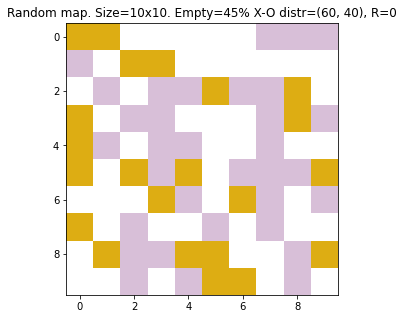

...

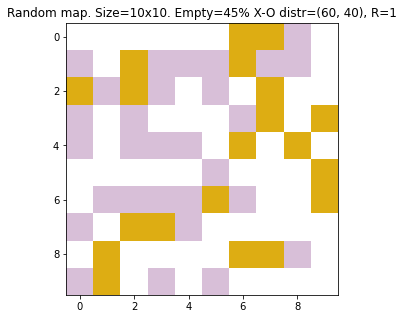

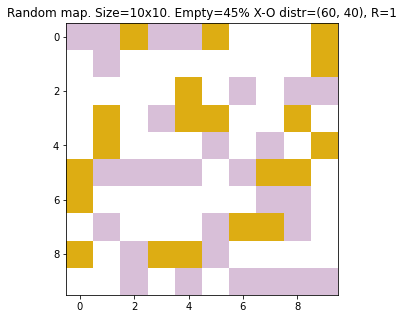

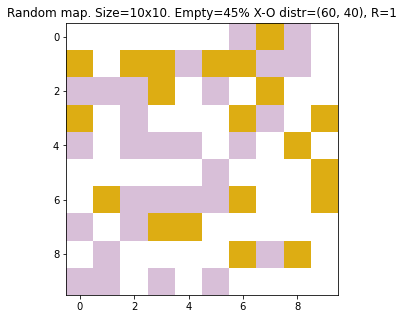

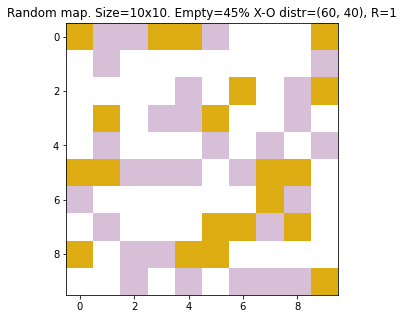

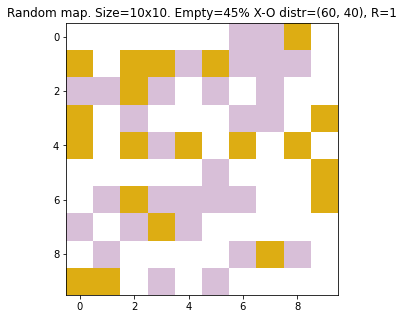

In [9]:
#Global parameters for functions
N_M = 10
empty_persent = 45
white_black_distr = (60,40)
R_range = ['0', '1/8', '2/8', '3/8', '4/8', '5/8', '6/8', '7/8', '1']

#Results. Data saving for gif
How_many_games = 15
gif = []

for R in R_range:
    for i in range(How_many_games):
        if i == 0:
            target_map, for_plot = plot_changing(first_random_map())
            gif.append(target_map)
        else:
            target_map, for_plot = plot_changing(target_map)
            gif.append(target_map)

### Data for Plotting

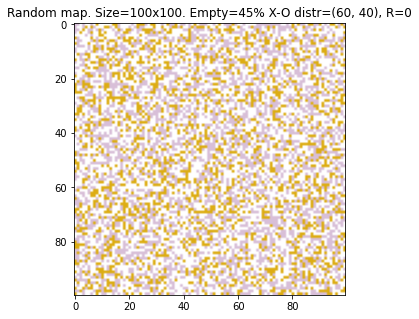

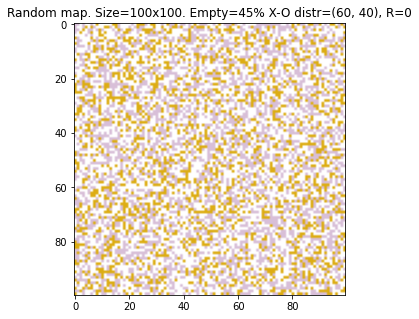

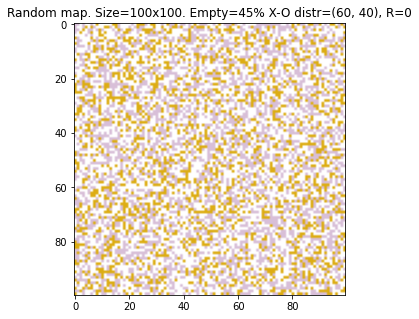

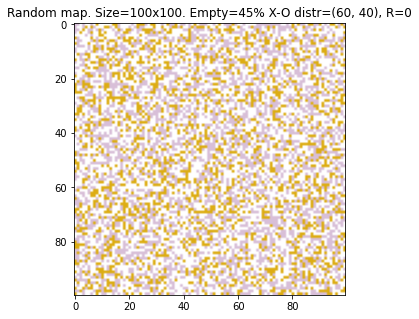

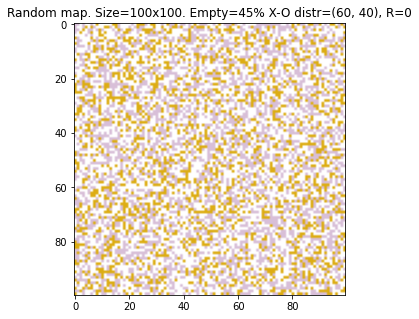

...

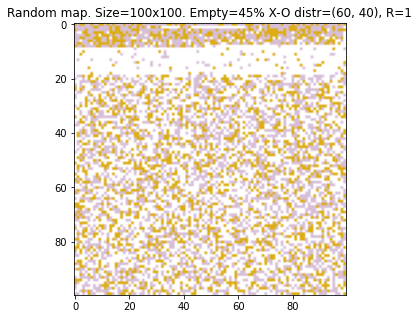

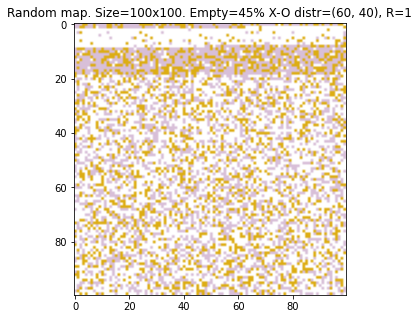

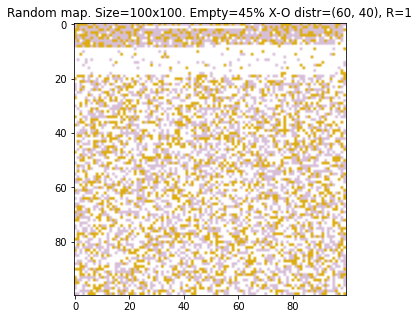

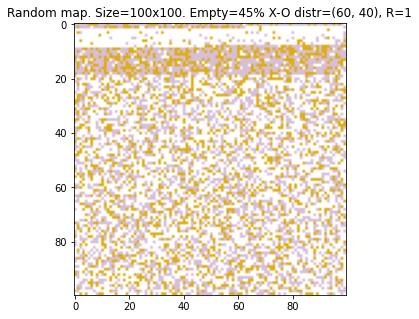

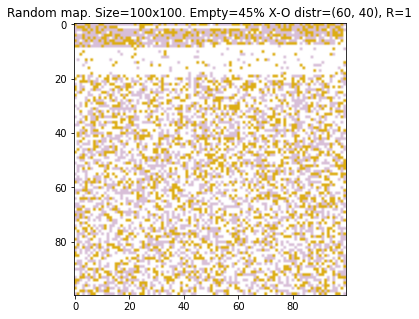

In [21]:
#Global parameters for functions
N_M = 100
empty_persent = 45
white_black_distr = (60,40)
R_list = ['0', '1/8', '2/8', '3/8', '4/8', '5/8', '6/8', '7/8', '1']


How_many_games = 10
i_want_to_move = []


for R in R_list:    

    for i in range(How_many_games):
        if i == 0:
            target_map, for_plot = plot_changing(first_random_map())
            i_want_to_move.append(for_plot)
        else:
            target_map, for_plot = plot_changing(target_map)
            i_want_to_move.append(for_plot)

In [70]:
# plt_0 = i_want_to_move[:How_many_games]
# plt_1_8 = i_want_to_move[How_many_games:How_many_games*2]
# plt_2_8 = i_want_to_move[How_many_games*2:How_many_games*3]
# plt_3_8 = i_want_to_move[How_many_games*3:How_many_games*4]
# plt_4_8 = i_want_to_move[How_many_games*4:How_many_games*5]
# plt_5_8 = i_want_to_move[How_many_games*5:How_many_games*6]
# plt_6_8 = i_want_to_move[How_many_games*6:How_many_games*7]
# plt_7_8= i_want_to_move[How_many_games*7:How_many_games*8]
# plt_1 =  i_want_to_move[How_many_games*8:]

In [71]:
# len_0, len_1_8, len_2_8, len_3_8, len_4_8, len_5_8, len_6_8, len_7_8, len_1  = [],[],[],[],[],[],[],[],[]
# for i in range(How_many_games):
#     len_0.append(len(plt_0[i]))
#     len_1_8.append(len(plt_1_8[i]))
#     len_2_8.append(len(plt_2_8[i]))
#     len_3_8.append(len(plt_3_8[i]))
#     len_4_8.append(len(plt_4_8[i]))
#     len_5_8.append(len(plt_5_8[i]))
#     len_6_8.append(len(plt_6_8[i]))
#     len_7_8.append(len(plt_7_8[i]))
#     len_1.append(len(plt_1[i]))


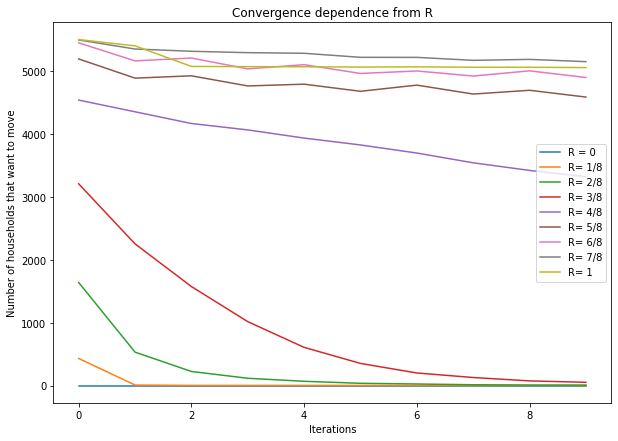

In [78]:
plt.figure(figsize=(10, 7))
plt.plot(len_0)
plt.plot(len_1_8)
plt.plot(len_2_8)
plt.plot(len_3_8)
plt.plot(len_4_8)
plt.plot(len_5_8)
plt.plot(len_6_8)
plt.plot(len_7_8)
plt.plot(len_1)

plt.title('Convergence dependence from R')
plt.xlabel('Iterations')
plt.ylabel('Number of households that want to move')
plt.legend(['R = 0', 'R= 1/8', 'R= 2/8', 'R= 3/8', 'R= 4/8', 'R= 5/8', 'R= 6/8', 'R= 7/8', 'R= 1'])

plt.show()